In [1]:
import os
import anndata as ad
import numpy as np
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import style
import warnings
style.use("default")
warnings.filterwarnings('ignore')
%config InlineBackend.figure_format = "retina"
os.chdir("/data/proj/GCB_MK/scCT/nanoCT_EAE")

In [2]:
import pyBigWig
import pygenometracks as tracks #pycistopic env
import glob

In [3]:
def extractGeneAnnot(gtf_file, upstream = 2000, feature_type = "gene", annotation = "HAVANA"):
    """
    get coordinates and annotations of genes from a GTF file. Returns dictionary indexed by chromosome
    """
    gtf = {}
    
    with open(gtf_file) as f:
        for line in f:
            if line[0:2] != "##" and "\t"+feature_type+"\t" in line and "\t"+annotation+"\t" in line:
                line = line.rstrip("\n").split("\t")
                if line[6] == "+":
                    if line[0] not in gtf.keys():
                        gtf[line[0]] = [[int(line[3])-upstream, int(line[4]), line[-1].split(";")[:-1]]]
                    else:
                        gtf[line[0]].append([int(line[3])-upstream, int(line[4]), line[-1].split(";")[:-1]])
                else:
                    if line[0] not in gtf.keys():
                        gtf[line[0]] = [[int(line[3]), int(line[4])+upstream, line[-1].split(";")[:-1]]]
                    else:
                        gtf[line[0]].append([int(line[3]), int(line[4])+upstream, line[-1].split(";")[:-1]])
    return gtf

In [5]:
gene_annot = extractGeneAnnot("/data/proj/GCB_MK/CZI/episcanpy_analysis/AGG_ATAC_210218/ref/gencode.v35.annotation.gtf")

In [47]:


genes = ["PLP1","PDGFRA","AQP4","CX3CR1","AIF1","SLC17A7","GAD1","RBFOX3"]
genes = ["AQP4","ALDH1L1","SLC17A7","RBFOX3","GAD1","CX3CR1","AIF1","PLP1","CNP","PDGFRA","PTPRZ1"]
genes = ["AQP4","PDGFRA","MBP","CX3CR1","SLC17A7",'GAD1',"PLP1"]
genes = ["AQP4","SLC17A7","RBFOX3","GAD1","CX3CR1","PLP1","PDGFRA"]

gene_coords = []
for k in gene_annot.keys():
    for item in gene_annot[k]:
        gene_coords.append([item[-1][2].split('name "')[-1].split('"')[0], k, str(item[0]),str(item[1])])
gene_names = [x[0] for x in gene_coords]

ranges = []
for g in genes:
    ranges.append(gene_coords[gene_names.index(g)])

In [48]:
for x in range(len(ranges)):
    ranges[x][2] =str(int(ranges[x][2])-10000)
    ranges[x][3] =str(int(ranges[x][3])+10000)
ranges

[['AQP4', 'chr18', '26842043', '26877771'],
 ['SLC17A7', 'chr19', '49419401', '49454360'],
 ['RBFOX3', 'chr17', '79079345', '79528148'],
 ['GAD1', 'chr2', '170801213', '170871151'],
 ['CX3CR1', 'chr3', '39253495', '39293735'],
 ['PLP1', 'chrX', '103761718', '103802619'],
 ['PDGFRA', 'chr4', '54217280', '54308245']]

In [51]:
for x in range(len(ranges)):
    print(f'{ranges[x][0]} - {ranges[x][1]}:{ranges[x][2]}-{ranges[x][3]}')

AQP4 - chr18:26842043-26877771
SLC17A7 - chr19:49419401-49454360
RBFOX3 - chr17:79079345-79528148
GAD1 - chr2:170801213-170871151
CX3CR1 - chr3:39253495-39293735
PLP1 - chrX:103761718-103802619
PDGFRA - chr4:54217280-54308245


In [24]:
bigwig_dir = "/data/proj/GCB_MK/CZI/episcanpy_analysis/AGG_ATAC_210218/data/cluster_fragments/OLD/ALL_CELL_TYPES/BW_FILES"
N_files = len(glob.glob(bigwig_dir + '/*.bw'))
files = [os.path.join(bigwig_dir,x) for x in os.listdir(bigwig_dir) if x.endswith(".bw")]

In [25]:
colors = ["green","blue","brown","pink","red","orange","grey"]

In [26]:
files

['/data/proj/GCB_MK/CZI/episcanpy_analysis/AGG_ATAC_210218/data/cluster_fragments/OLD/ALL_CELL_TYPES/BW_FILES/all_Astro_1.bed.rpkm.bw',
 '/data/proj/GCB_MK/CZI/episcanpy_analysis/AGG_ATAC_210218/data/cluster_fragments/OLD/ALL_CELL_TYPES/BW_FILES/all_BA4_Ex_Neu_1.bed.rpkm.bw',
 '/data/proj/GCB_MK/CZI/episcanpy_analysis/AGG_ATAC_210218/data/cluster_fragments/OLD/ALL_CELL_TYPES/BW_FILES/all_CB_Ex_Neu_1.bed.rpkm.bw',
 '/data/proj/GCB_MK/CZI/episcanpy_analysis/AGG_ATAC_210218/data/cluster_fragments/OLD/ALL_CELL_TYPES/BW_FILES/all_Inh_Neu_1.bed.rpkm.bw',
 '/data/proj/GCB_MK/CZI/episcanpy_analysis/AGG_ATAC_210218/data/cluster_fragments/OLD/ALL_CELL_TYPES/BW_FILES/all_MiGL_1.bed.rpkm.bw',
 '/data/proj/GCB_MK/CZI/episcanpy_analysis/AGG_ATAC_210218/data/cluster_fragments/OLD/ALL_CELL_TYPES/BW_FILES/all_Oligo_1.bed.rpkm.bw',
 '/data/proj/GCB_MK/CZI/episcanpy_analysis/AGG_ATAC_210218/data/cluster_fragments/OLD/ALL_CELL_TYPES/BW_FILES/all_OPC_1.bed.rpkm.bw']

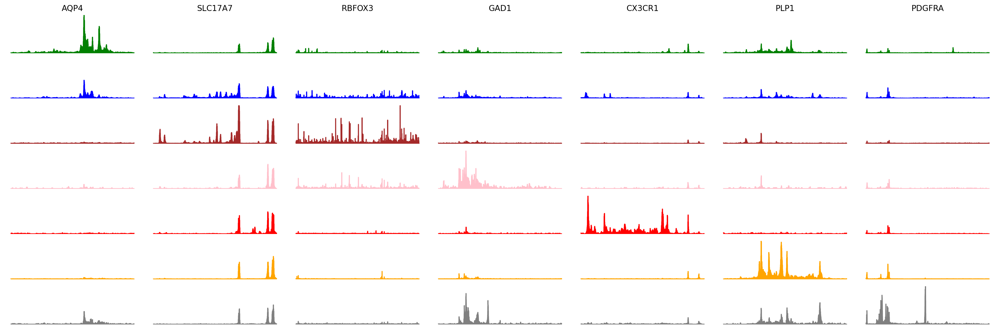

In [49]:
bigwig_dir = "/data/proj/GCB_MK/CZI/episcanpy_analysis/AGG_ATAC_210218/data/cluster_fragments/OLD/ALL_CELL_TYPES/BW_FILES"
N_files = len(glob.glob(bigwig_dir + '/*.bw'))
files = [os.path.join(bigwig_dir,x) for x in os.listdir(bigwig_dir) if x.endswith(".bw")]

fig, ax = plt.subplots(N_files, len(ranges), figsize=((3*len(ranges)), N_files))
for c, ran in enumerate(ranges):
    data = []
    for i in range(N_files):
        with pyBigWig.open(files[i]) as bw:
            data.append(np.nan_to_num(bw.values(ran[1], int(ran[2]), int(ran[3]), numpy=True),0))
#    data.append(np.nan_to_num(bw_file.values(ran[1], ran[2], ran[3], numpy=True),0))

    x = np.fromiter(range(len(data[0])), dtype=int)
    height = max([max(x) for x in data])
    for i, v in enumerate(data):
        ax[i,c].plot(v, color=colors[i])
        ax[i,c].fill_between(x,v, alpha=1, color = colors[i])
        ax[i,c].set_ylim(0,height)
        ax[i,c].axis('off')
    ax[0,c].set_title(ran[0])
plt.tight_layout()

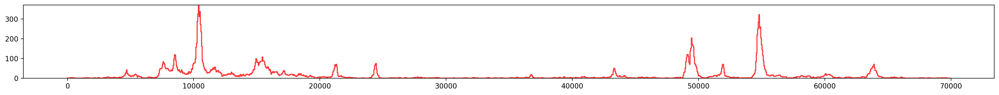

In [322]:
fig, ax = plt.subplots(1, 1, figsize=(20, 2))
#for c, ran in enumerate(ranges):
data = []
for i in range(1):
    with pyBigWig.open("/data/proj/GCB_MK/CZI/episcanpy_analysis/AGG_ATAC_210218/data/cluster_fragments/OLD/ALL_CELL_TYPES/BW_FILES/all_OPC_1.bed.rpkm.bw") as bw:
        data.append(np.nan_to_num(bw.values("chr21", 33_015_322, 33_085_242, numpy=True),0))

#    data.append(np.nan_to_num(bw_file.values(ran[1], ran[2], ran[3], numpy=True),0))

x = np.fromiter(range(len(data[0])), dtype=int)
height = max([max(x) for x in data])
for i, v in enumerate(data):
    ax.plot(v, color="red", alpha=0.8)
    ax.fill_between(x,v, alpha=.5, color = "white")
    ax.set_ylim(0,height)
#    ax.axis('off')
#ax.set_title(ran[0])
plt.tight_layout()

In [155]:
[max(x) for x in data]

[370.935]

In [159]:
adata = ad.read("../../CZI/episcanpy_analysis/AGG_ATAC_210218/PIPELINE/data/220906_2kb_matrix_iterativeLSI_results_hiQ_annotated.h5ad")
adata

AnnData object with n_obs × n_vars = 117543 × 100018
    obs: 'NGI_ID', 'NGS_BATCH', 'caseNO', 'Tissue', 'Sex', 'Age', 'PMI', '10X_BATCH', 'nb_features', 'log_nb_features', 'leiden_iter_1', 'leiden_iter_2', 'leiden_iter_3', 'leiden_iter_4', 'annot_rough', 'doublet_scores', 'predicted_doublets', 'ArchR_id', 'is_ArchR_hiQ'
    var: 'n_cells'
    uns: 'annot_rough_colors', 'is_ArchR_hiQ_colors', 'leiden', 'leiden_iter_4_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    layers: 'normalized_counts', 'raw_counts'
    obsp: 'connectivities', 'distances'

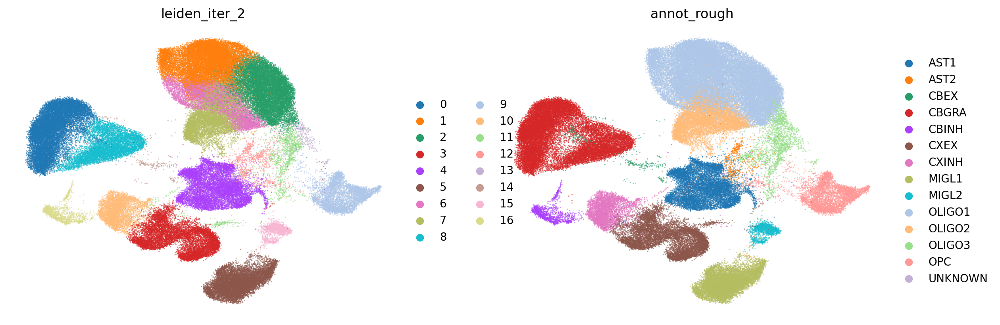

In [177]:
sc.pl.umap(adata[adata.obs.predicted_doublets==False], color=["leiden_iter_2","annot_rough"],size=5,frameon=False, alpha=0.6)

In [ ]:
import os
import pandas as pd
import numpy as np
import anndata as ad
import matplotlib.pyplot as plt
import seaborn as sns
import pyBigWig
#import pygenometracks
import glob

os.chdir("/data/proj/GCB_MK/scCT/nanoCT_EAE")

# read in AnnData
adata = ad.read("../../CZI/episcanpy_analysis/AGG_ATAC_210218/PIPELINE/data/220906_2kb_matrix_iterativeLSI_results_hiQ_annotated.h5ad")




## Modify the cell metadata
adata.obs["new_annot"] = adata.obs.annot_rough.tolist()
adata.obs.loc[adata.obs["annot_rough"].isin(["AST1","AST2"]), "new_annot"] = "AST"
adata.obs.loc[adata.obs["annot_rough"].isin(["OLIGO1","OLIGO2","OLIGO3"]), "new_annot"] = "MOL"
adata.obs.loc[adata.obs["annot_rough"]=="MIGL2", "new_annot"] = "ENDO"
adata.obs.loc[adata.obs["annot_rough"]=="MIGL1", "new_annot"] = "MIGL"
adata = adata[(adata.obs.annot_rough!="UNKNOWN")&(adata.obs.predicted_doublets==False)]

annotations = pd.read_csv("/proj/tmp/mukund/MK_atac_RNAannotations.csv", index_col=0)
annotations = annotations.reindex(index=adata.obs.index)
#annotations = annotations.reset_index()
annotation_dict = dict(zip(annotations.index, zip(annotations.MK_ATAC, annotations.LS_RNA, annotations.Nat19_RNA)))
adata.obs["LS_RNA"] = [annotation_dict[k][1] for k in adata.obs.index]
adata.obs["Nat19_RNA"] = [annotation_dict[k][2] for k in adata.obs.index]

##
## Might want to also read in the original 2kb matrix with NO bins filtered out
##
fulldata = ad.read("/data/proj/GCB_MK/CZI/episcanpy_analysis/AGG_ATAC_210218/PIPELINE/data/matrices/211215_2kb_matrix.h5ad")

fulldata = fulldata[fulldata.obs.index.isin(adata.obs.index)]

ctype_dict = dict(zip(adata.obs.index, adata.obs.new_annot))
fulldata.obs["new_annot"] = [ctype_dict[k] for k in fulldata.obs.index]

fulldata.var["chrom"] = [x.split("_")[0] for x in fulldata.var.index]
fulldata.var["start"] = [int(x.split("_")[1]) for x in fulldata.var.index]
fulldata.var["end"] = [int(x.split("_")[2]) for x in fulldata.var.index]

In [15]:
adata = ad.read("mtx/ATAC_object_230726.h5ad")
fulldata = ad.read("/data/proj/GCB_MK/CZI/episcanpy_analysis/AGG_ATAC_210218/PIPELINE/data/matrices/211215_2kb_matrix.h5ad")

fulldata = fulldata[fulldata.obs.index.isin(adata.obs.index)]

ctype_dict = dict(zip(adata.obs.index, adata.obs.new_annot))
fulldata.obs["new_annot"] = [ctype_dict[k] for k in fulldata.obs.index]

fulldata.var["chrom"] = [x.split("_")[0] for x in fulldata.var.index]
fulldata.var["start"] = [int(x.split("_")[1]) for x in fulldata.var.index]
fulldata.var["end"] = [int(x.split("_")[2]) for x in fulldata.var.index]

In [40]:
#smalldata = fulldata[(fulldata.obs.new_annot.isin(["OPC","MOL"]))&(fulldata.obs.Tissue=="BA4")]
smalldata = fulldata[(fulldata.obs.new_annot.isin(["AST"]))]
#smalldata = fulldata[(fulldata.obs.new_annot.isin(["OPC","MOL"]))]
bw_file = "../../CZI/episcanpy_analysis/AGG_ATAC_210218/data/cluster_fragments/OLD/ALL_CELL_TYPES/BW_FILES/all_Oligo_1.bed.rpkm.bw"
bw_file = "../../CZI/episcanpy_analysis/AGG_ATAC_210218/data/cluster_fragments/OLD/ALL_CELL_TYPES/BW_FILES/all_Astro_1.bed.rpkm.bw"
#bw_file = "../../CZI/episcanpy_analysis/AGG_ATAC_210218/data/cluster_fragments/OLD/OL_TISSUE/BW_FILES/OLG_BA4.bed.rpkm.bw"

window="chr4-54220116-54319893" #pdgfra

#window="chr6-31613234-31619015" #AIF1

#window="chr2-176_079_980-176_210_063" #HOXD

#window="chr7-27082225-27222386" #HOXA

window = "chr2-175_851_082-176_654_563" #HOXD_long
window="chr21-32946635-33145007" #OLIG1-OLIG2
window="chrX-103771718-103792619" #PLP1
window="chr18-76900000-77200000" #mbp
window = "chr18-26_846_135-26_871_728" #AQP4
window = "chr3-126_101_561-126_183_186" #ALDH1L1
c,s,e = window.split("-")

xdata = smalldata[:,(smalldata.var.chrom==c) & (smalldata.var.start>=int(s)) & (smalldata.var.end<=int(e))]

df = pd.DataFrame.sparse.from_spmatrix(xdata.X)
#df["sum"] = df.sum(axis=1)
#df = df.sort_values(by="sum", ascending=False).iloc[:, :-1]

In [41]:
import pygenometracks

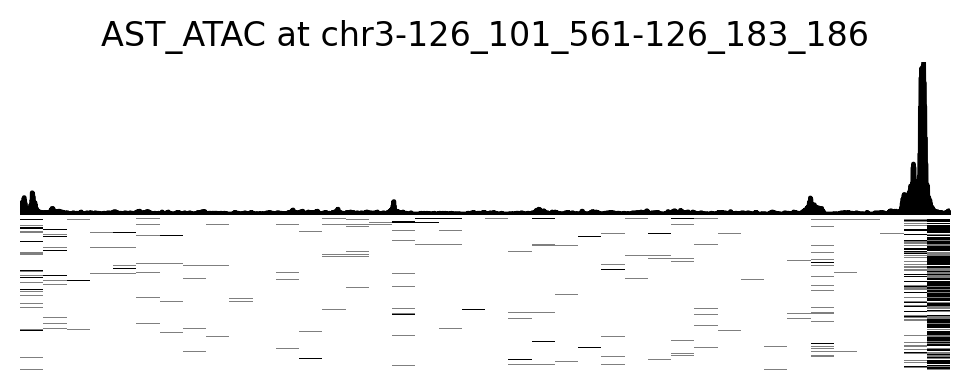

In [46]:
#smalldata = fulldata[(fulldata.obs.new_annot.isin(["OPC","MOL"]))&(fulldata.obs.Tissue=="BA4")]
#bw_file = "../../CZI/episcanpy_analysis/AGG_ATAC_210218/data/cluster_fragments/OLD/OL_TISSUE/BW_FILES/OLG_BA4.bed.rpkm.bw"

pop = "AST"
mod = "ATAC"


col  = {"H3K27me3":"red", "H3K27ac":"green", "ATAC":"blue"}
    


fig, ax = plt.subplots(2, 1, figsize=(6,2), gridspec_kw={'height_ratios': [1, 1]})
#fig, ax = plt.subplots(2, 3, figsize=(16,3), gridspec_kw={'height_ratios': [1, 1.5]})

#plt.rcParams["figure.figsize"] = (10 ,2.5)

df["sum"] = df.sum(axis=1)
df = df.sort_values(by="sum", ascending=False).iloc[:, :-1]

#bw_file = "../../CZI/episcanpy_analysis/AGG_ATAC_210218/data/cluster_fragments/OLD/ALL_CELL_TYPES/BW_FILES/all_OPC_1.bed.rpkm.bw"


#fig, ax = plt.subplots(1, 1, figsize=(10, 4))
#for c, ran in enumerate(ranges):
data = []
for i in range(1):
    with pyBigWig.open(bw_file) as bw:
        data.append(np.nan_to_num(bw.values(c, int(s), int(e), numpy=True),0))
#    data.append(np.nan_to_num(bw_file.values(ran[1], ran[2], ran[3], numpy=True),0))

x = np.fromiter(range(len(data[0])), dtype=int)
height = max([max(x) for x in data])
#height=159.23
#height=225
#height=120
for i, v in enumerate(data):

    ax[0].plot(v, color="black", alpha=1)
    ax[0].fill_between(x,v, alpha=1, color = "black")
    ax[0].set_ylim(0,height)
    ax[0].set_xlim([0,int(e)-int(s)])
    ax[0].axis('off')

    ax[0].set_title(f"{pop}_{mod} at {window}")

def heatmap2d(arr: np.ndarray,
             cmap="viridis"):
    
    ax[1] = plt.imshow(arr, cmap=cmap, aspect="auto", vmin=0, vmax=6)
    plt.axis('off')
#    plt.colorbar()
#    plt.show()

#test_array = np.arange(50 * 50).reshape(50, 50)
test_array = df.head(1000).values#.reshape(50,50)
#test_array = np.where(df.head(500).values>1,1,0)
#heatmap2d(test_array, cmap="binary")
sns.heatmap(test_array, xticklabels=False, yticklabels=False, cmap="binary", vmax=2, ax=ax[1],cbar=False)

plt.subplots_adjust(wspace=0, hspace=0.03)
#plt.savefig('plots/BA4_OLG_ATAC_sc_tracks_HOXD_Long.png', dpi=600)
#plt.tight_layout()



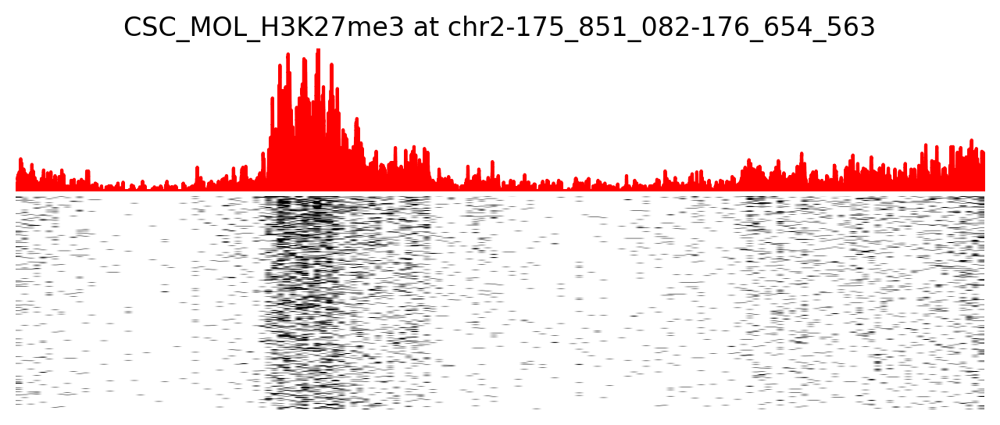

In [269]:
#smalldata = fulldata[(fulldata.obs.new_annot.isin(["OPC","MOL"]))&(fulldata.obs.Tissue=="BA4")]
#bw_file = "../../CZI/episcanpy_analysis/AGG_ATAC_210218/data/cluster_fragments/OLD/OL_TISSUE/BW_FILES/OLG_BA4.bed.rpkm.bw"

pop = "MOL"
mod = "H3K27me3"
reg = "CSC"

col  = {"H3K27me3":"red", "H3K27ac":"green", "ATAC":"blue"}


if mod == "ATAC":
    smalldata = fulldata[(fulldata.obs.new_annot==pop)&(fulldata.obs.Tissue==reg)]
    bw_file = f"/data/proj/GCB_MK/scCT/nanoCT_EAE/data/bw_tracks/{pop}_{reg}_{mod}.bed.rpkm.bw"
    
else:
    bw_file = f"/data/proj/GCB_MK/scCT/nanoCT_EAE/data/bw_tracks/{pop}_{reg}_{mod}_fragments.bed.sorted.bam.rpkm.bw"
    if mod =="H3K27ac":
        smalldata = acdata[(acdata.obs.new_annot==pop)&(acdata.obs.Tissue==reg)]
    elif mod =="H3K27me3":
        smalldata = medata[(medata.obs.new_annot==pop)&(medata.obs.Tissue==reg)]

window="chr4-54220116-54319893" #pdgfra
#window="chr18-76900000-77200000" #mbp
#window="chr6-31613234-31619015" #AIF1

window="chr2-176_079_980-176_210_063" #HOXD

#window="chr7-27082225-27222386" #HOXA
window = "chr3-126_101_561-126_183_186" #ALDH1L1
window = "chr18-26_846_135-26_871_728" #AQP4
window = "chr2-175_851_082-176_654_563" #HOXD_long
c,s,e = window.split("-")

xdata = smalldata[:,(smalldata.var.chrom==c) & (smalldata.var.start>=int(s)) & (smalldata.var.end<=int(e))]

df = pd.DataFrame.sparse.from_spmatrix(xdata.X)
#df["sum"] = df.sum(axis=1)
#df = df.sort_values(by="sum", ascending=False).iloc[:, :-1]

fig, ax = plt.subplots(2, 1, figsize=(8,3), gridspec_kw={'height_ratios': [1, 1.5]})
#fig, ax = plt.subplots(2, 3, figsize=(16,3), gridspec_kw={'height_ratios': [1, 1.5]})

#plt.rcParams["figure.figsize"] = (10 ,2.5)

df["sum"] = df.sum(axis=1)
df = df.sort_values(by="sum", ascending=False).iloc[:, :-1]

#bw_file = "../../CZI/episcanpy_analysis/AGG_ATAC_210218/data/cluster_fragments/OLD/ALL_CELL_TYPES/BW_FILES/all_OPC_1.bed.rpkm.bw"


#fig, ax = plt.subplots(1, 1, figsize=(10, 4))
#for c, ran in enumerate(ranges):
data = []
for i in range(1):
    with pyBigWig.open(bw_file) as bw:
        data.append(np.nan_to_num(bw.values(c, int(s), int(e), numpy=True),0))
#    data.append(np.nan_to_num(bw_file.values(ran[1], ran[2], ran[3], numpy=True),0))

x = np.fromiter(range(len(data[0])), dtype=int)
height = max([max(x) for x in data])
#height=159.23
#height=225
#height=120
for i, v in enumerate(data):

    ax[0].plot(v, color=col[mod], alpha=1)
    ax[0].fill_between(x,v, alpha=1, color = col[mod])
    ax[0].set_ylim(0,height)
    ax[0].set_xlim([0,int(e)-int(s)])
    ax[0].axis('off')

    ax[0].set_title(f"{reg}_{pop}_{mod} at {window}")

def heatmap2d(arr: np.ndarray,
             cmap="viridis"):
    
    ax[1] = plt.imshow(arr, cmap=cmap, aspect="auto", vmin=0, vmax=1)
    plt.axis('off')
#    plt.colorbar()
#    plt.show()

#test_array = np.arange(50 * 50).reshape(50, 50)
test_array = df.head(500).values#.reshape(50,50)
#test_array = np.where(df.head(500).values>1,1,0)
heatmap2d(test_array, cmap="binary")

plt.subplots_adjust(wspace=0, hspace=0.03)
#plt.savefig('plots/BA4_OLG_ATAC_sc_tracks_HOXD_Long.png', dpi=600)
#plt.tight_layout()



In [319]:
pop = "OPC"
reg = "CSC"
reg2 = "BA4"

window = "chr2-222_185_480-222_308_393" #PAX3
window = "chr7-26650722-26903034" #SKAP2
window = "chr2-175_851_082-176_654_563" #HOXD_long
scaled_max(pop, window)

{'ATAC': 183.894, 'H3K27ac': 74.8686, 'H3K27me3': 290.8}

In [27]:
def scaled_max(
pop: str, 
window: str):
    
    modalities = ["ATAC","H3K27ac", "H3K27me3"]
    c,s,e = window.split("-")
    scaled_vals = {}
    
    for mod in modalities:
        data = []
        files = []   
        for r in ["CSC","BA4"]:
            if mod == "ATAC":
                f = f"/data/proj/GCB_MK/scCT/nanoCT_EAE/data/bw_tracks/{pop}_{r}_{mod}.bed.rpkm.bw"
            else:
                f = f"/data/proj/GCB_MK/scCT/nanoCT_EAE/data/bw_tracks/{pop}_{r}_{mod}_fragments.bed.sorted.bam.rpkm.bw"
            files.append(f)
            
        for bw_file in files:
            with pyBigWig.open(bw_file) as bw:
                data.append(np.nan_to_num(bw.values(c, int(s), int(e), numpy=True),0))        

        x = np.fromiter(range(len(data[0])), dtype=int)
        height = max([max(x) for x in data])
        scaled_vals[mod] = max([max(x) for x in data]) #height = max([max(x) for x in data])
    return scaled_vals


def plot_sc_coverage(
pop: str, 
reg: str,
window: str,
n_cells =500,
nanoct=True,
save=None):

    if nanoct:
        modalities = ["ATAC","H3K27ac", "H3K27me3"]
    else :
        modalities = ["ATAC"]

    c,s,e = window.split("-")
    col  = {"H3K27me3":"red", "H3K27ac":"green", "ATAC":"blue"}

    data = []
    mtx = []

    for mod in modalities:
        ## Store Count Matrix
        if mod == "ATAC":
            smalldata = fulldata[(fulldata.obs.new_annot==pop)&(fulldata.obs.Tissue==reg)]
            mtx.append(smalldata)
            bw_file = f"/data/proj/GCB_MK/scCT/nanoCT_EAE/data/bw_tracks/{pop}_{reg}_{mod}.bed.rpkm.bw"

        else:
#            bw_file = f"/data/proj/GCB_MK/scCT/nanoCT_EAE/data/bw_tracks/{pop}_{reg}_{mod}_fragments.bed.sorted.bam.rpkm.bw"
            bw_file = f"/data/proj/GCB_MK/scCT/nanoCT_EAE/fragments/P29054/MOL_OPC_tissue/{mod}/BW_FILES/{reg}_{pop}_{mod}_fragments.bed.rpkm.bw"
            if mod =="H3K27ac":
                smalldata = acdata[(acdata.obs.new_annot==pop)&(acdata.obs.Tissue==reg)]
                mtx.append(smalldata)
            elif mod =="H3K27me3":
                smalldata = medata[(medata.obs.new_annot==pop)&(medata.obs.Tissue==reg)]
                mtx.append(smalldata)

        ## Store BW files
        with pyBigWig.open(bw_file) as bw:
            data.append(np.nan_to_num(bw.values(c, int(s), int(e), numpy=True),0))
                #data.append(np.nan_to_num(bw_file.values(ran[1], ran[2], ran[3], numpy=True),0))


    if len(modalities)==1:
        fig, ax = plt.subplots(2, 1, figsize=(8,3))# , gridspec_kw={'height_ratios': [1, 1.5]})

        for i, bw in enumerate(data):
            xdata = mtx[i]
            xdata = xdata[:,(xdata.var.chrom==c) & (xdata.var.start>=int(s)) & (xdata.var.end<=int(e))]

            df = pd.DataFrame.sparse.from_spmatrix(xdata.X)
            df["sum"] = df.sum(axis=1)
            df = df.sort_values(by="sum", ascending=False).iloc[:, :-1]

            x = np.fromiter(range(len(bw)), dtype=int) ## only needed when plotting CSC v BA4, to have the same scale.
            height = max([max(bw)])
            height = scaled_max(pop, window)[modalities[i]]

            ax[0].plot(bw, color="black", alpha=1)
            ax[0].fill_between(x,bw, alpha=1, color ="black")
            ax[0].set_ylim(0,height)
            ax[0].set_xlim([0,int(e)-int(s)])
            ax[0].axis('off')

            ax[0].set_title(f"{reg}_{pop}_{modalities[i]}",)
            ax[0].text(0.01, 1 , f"[0 - {int(height)}]",transform=ax[0].transAxes)
            arr = df.head(n_cells).values#.reshape(50,50)
            ax[1].imshow(arr, cmap="binary", aspect="auto", vmin=0, vmax=1)
            ax[1].axis('off')

        plt.subplots_adjust(wspace=0.05, hspace=0.03)
        plt.tight_layout()
        if save is not None:
            fig.savefig(save, dpi=400, bbox_inches='tight')
        
        
    else:
        fig, ax = plt.subplots(2, 3, figsize=(24,3))# , gridspec_kw={'height_ratios': [1, 1.5]})

        for i, bw in enumerate(data):
            xdata = mtx[i]
            xdata = xdata[:,(xdata.var.chrom==c) & (xdata.var.start>=int(s)) & (xdata.var.end<=int(e))]

            df = pd.DataFrame.sparse.from_spmatrix(xdata.X)
            df["sum"] = df.sum(axis=1)
            df = df.sort_values(by="sum", ascending=False).iloc[:, :-1]

            x = np.fromiter(range(len(bw)), dtype=int) ## only needed when plotting CSC v BA4, to have the same scale.
            height = max([max(bw)])
            height = scaled_max(pop, window)[modalities[i]]

            ax[0,i].plot(bw, color=col[modalities[i]], alpha=1)
            ax[0,i].fill_between(x,bw, alpha=1, color = col[modalities[i]])
            ax[0,i].set_ylim(0,height)
            ax[0,i].set_xlim([0,int(e)-int(s)])
            ax[0,i].axis('off')

            ax[0,i].set_title(f"{reg}_{pop}_{modalities[i]}",)
            ax[0,i].text(0.01, 1 , f"[0 - {int(height)}]",transform=ax[0,i].transAxes)


            arr = df.head(n_cells).values#.reshape(50,50)
            ax[1,i].imshow(arr, cmap="binary", aspect="auto", vmin=0, vmax=1)
            ax[1,i].axis('off')

        #plt.axis('off')
        #    plt.colorbar()
        #    plt.show()

        plt.subplots_adjust(wspace=0.05, hspace=0.03)
    #    plt.savefig('plots/BA4_OLG_ATAC_sc_tracks_HOXD_Long.png', dpi=600, bbox_inches='tight')
        plt.tight_layout()



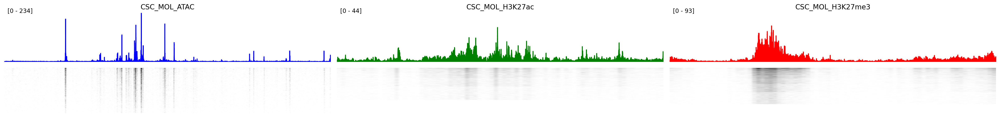

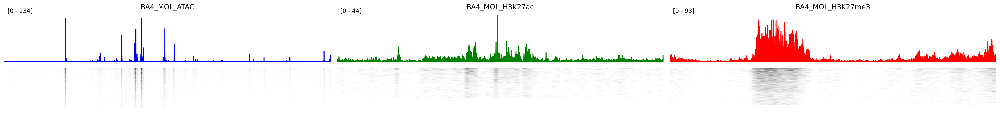

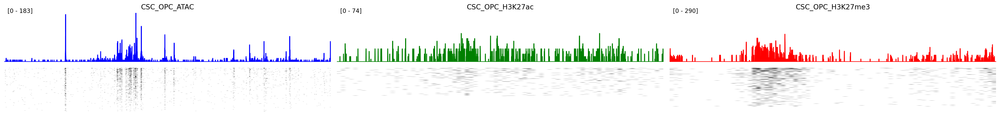

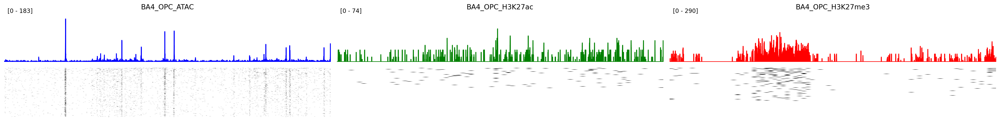

In [77]:
pop1 = "MOL"
pop2 = "OPC"
reg1 = "CSC"
reg2 = "BA4"

#window = "chr2-222_185_480-222_308_393" #PAX3
#window = "chr7-26650722-26903034" #SKAP2
window = "chr2-175_851_082-176_654_563" #HOXD_long
#window = "chr7-26600000-28200000" #HOXA_long

plot_sc_coverage(pop1,reg1, window, n_cells=40000)
plot_sc_coverage(pop1,reg2, window, n_cells=40000)
plot_sc_coverage(pop2,reg1, window, n_cells=800)
plot_sc_coverage(pop2,reg2, window, n_cells=800)


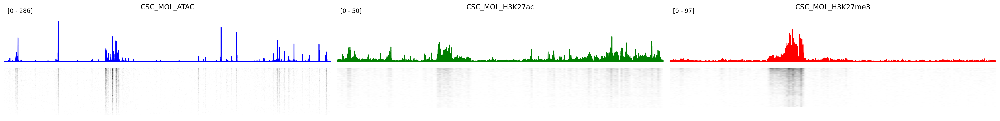

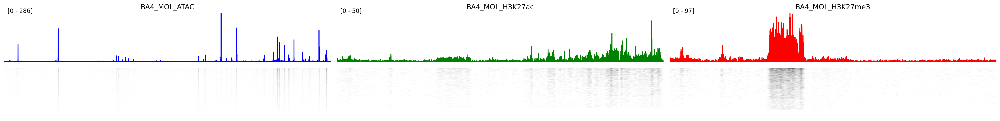

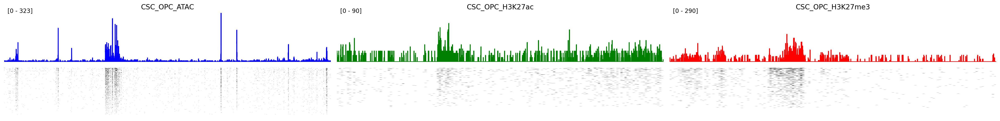

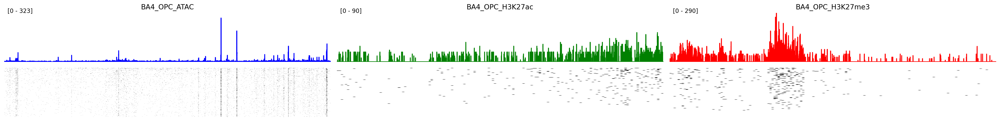

In [78]:
pop1 = "MOL"
pop2 = "OPC"
reg1 = "CSC"
reg2 = "BA4"

#window = "chr2-222_185_480-222_308_393" #PAX3
#window = "chr7-26650722-26903034" #SKAP2
window = "chr2-175_851_082-176_654_563" #HOXD_long
window = "chr7-26600000-28200000" #HOXA_long

plot_sc_coverage(pop1,reg1, window, n_cells=40000)
plot_sc_coverage(pop1,reg2, window, n_cells=40000)
plot_sc_coverage(pop2,reg1, window, n_cells=800)
plot_sc_coverage(pop2,reg2, window, n_cells=800)

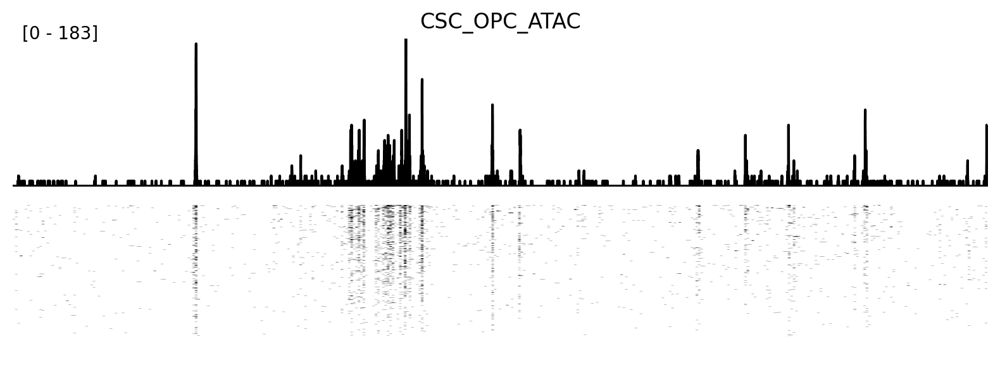

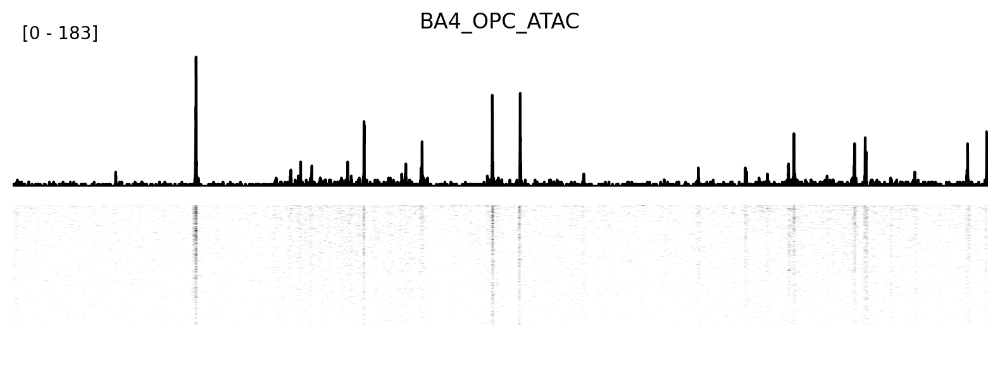

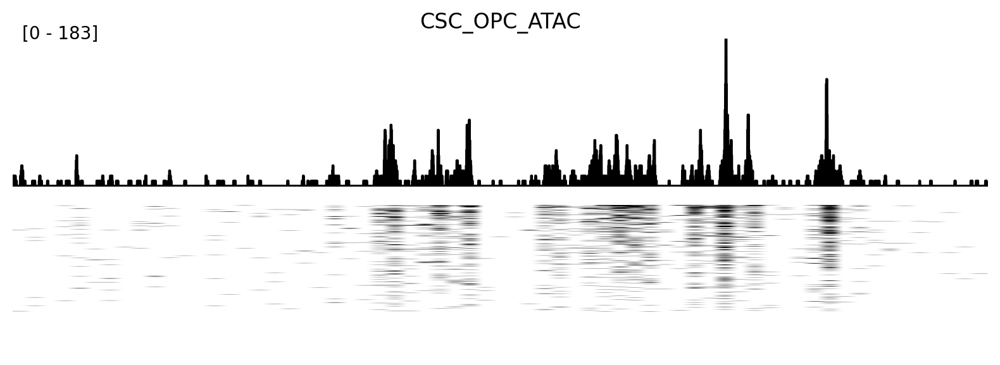

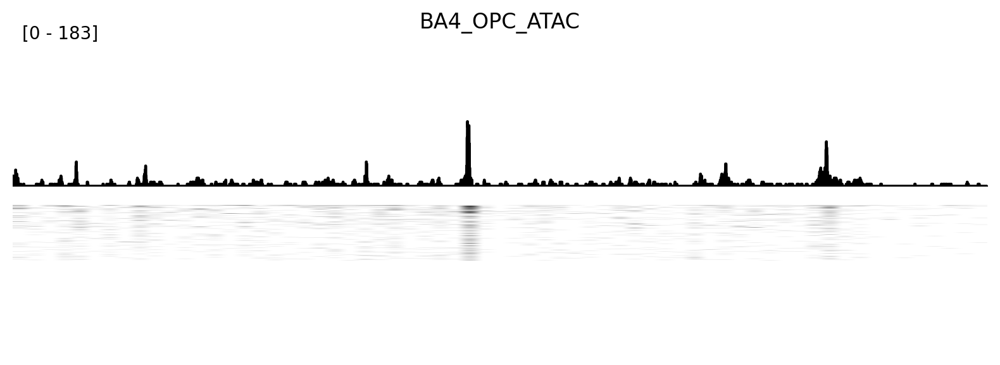

In [31]:
pop1 = "MOL"
pop1 = "OPC"
reg1 = "CSC"
reg2 = "BA4"

#window = "chr2-222_185_480-222_308_393" #PAX3
#window = "chr7-26650722-26903034" #SKAP2
window = ["chr2-175_851_082-176_654_563","HOXD_long"] #HOXD_long
window2=["chr2-176_079_980-176_210_063", "HOXD"] #HOXD
#window = ["chr7-26600000-28200000","HOXA_long"] #HOXA_long
#window2 = ["chr7-27070000-27230000","HOXA"] #HOXA

plot_sc_coverage(pop1,reg1, window[0], n_cells=40000, nanoct=False, save=f"plots/ATAC_scTrack_{pop1}_{reg1}_{window[1]}")
plot_sc_coverage(pop1,reg2, window[0], n_cells=40000, nanoct=False, save=f"plots/ATAC_scTrack_{pop1}_{reg2}_{window[1]}")
plot_sc_coverage(pop1,reg1, window2[0], n_cells=40000, nanoct=False, save=f"plots/ATAC_scTrack_{pop1}_{reg1}_{window2[1]}")
plot_sc_coverage(pop1,reg2, window2[0], n_cells=40000, nanoct=False, save=f"plots/ATAC_scTrack_{pop1}_{reg2}_{window2[1]}")

#plot_sc_coverage(pop2,reg1, window, n_cells=800)
#plot_sc_coverage(pop2,reg2, window, n_cells=800)


In [346]:
def scaled_max_atac(
window: str
):
    ctype_list = ['AST','OPC','MOL','MIGL','CXEX','CXINH']
    cdict = {'AST':"Astro",'OPC':"OPC",'MOL':"Oligo",'MIGL':"MiGL",'CXEX':"BA4_Ex_Neu",'CXINH':"Inh_Neu"}
    modalities = ["ATAC"]
    c,s,e = window.split("-")
    

    data = []
    files = []   
    for r in ctype_list:
        f = f"/data/proj/GCB_MK/CZI/episcanpy_analysis/AGG_ATAC_210218/data/cluster_fragments/OLD/ALL_CELL_TYPES/BW_FILES/all_{cdict[r]}_1.bed.rpkm.bw"
        files.append(f)
            
    for bw_file in files:
        with pyBigWig.open(bw_file) as bw:
            data.append(np.nan_to_num(bw.values(c, int(s), int(e), numpy=True),0))        

    x = np.fromiter(range(len(data[0])), dtype=int)
    height = max([max(x) for x in data])
    max_val = max([max(x) for x in data]) #height = max([max(x) for x in data])
    return max_val


def plot_ctype_signal(
window: str,
n_cells =500):

    
    ctype_list = ['AST','OPC','MOL','MIGL','CXEX','CXINH']
    cdict = {'AST':["Astro","green"],'OPC':["OPC","blue"],'MOL':["Oligo","red"],'MIGL':["MiGL","pink"],'CXEX':["BA4_Ex_Neu","brown"],'CXINH':["Inh_Neu","grey"]}
    modalities = ["ATAC"]
    c,s,e = window.split("-")
    col  = {"H3K27me3":"red", "H3K27ac":"green", "ATAC":"blue"}

    data = []
    mtx = []

    for r in ctype_list:
        bw_file = f"/data/proj/GCB_MK/CZI/episcanpy_analysis/AGG_ATAC_210218/data/cluster_fragments/OLD/ALL_CELL_TYPES/BW_FILES/all_{cdict[r][0]}_1.bed.rpkm.bw"
        smalldata = fulldata[(fulldata.obs.new_annot==r)]
        mtx.append(smalldata)

        ## Store BW files
        with pyBigWig.open(bw_file) as bw:
            data.append(np.nan_to_num(bw.values(c, int(s), int(e), numpy=True),0))
                #data.append(np.nan_to_num(bw_file.values(ran[1], ran[2], ran[3], numpy=True),0))



    fig, ax = plt.subplots(2, len(ctype_list), figsize=(24,3))# , gridspec_kw={'height_ratios': [1, 1.5]})

    for i, bw in enumerate(data):
        xdata = mtx[i]
        xdata = xdata[:,(xdata.var.chrom==c) & (xdata.var.start>=int(s)) & (xdata.var.end<=int(e))]

        df = pd.DataFrame.sparse.from_spmatrix(xdata.X)
        df["sum"] = df.sum(axis=1)
        df = df.sort_values(by="sum", ascending=False).iloc[:, :-1]

        x = np.fromiter(range(len(bw)), dtype=int) ## only needed when plotting CSC v BA4, to have the same scale.
        height = max([max(bw)])
        height = scaled_max_atac(window)

        ax[0,i].plot(bw, color=cdict[ctype_list[i]][1], alpha=1)
        ax[0,i].fill_between(x,bw, alpha=1, color = cdict[ctype_list[i]][1])
        ax[0,i].set_ylim(0,height)
        ax[0,i].set_xlim([0,int(e)-int(s)])
        ax[0,i].axis('off')

        ax[0,i].set_title(f"{ctype_list[i]}_ATAC",)
        ax[0,i].text(0.01, 0.95 , f"[0, {int(height)}]",transform=ax[0,i].transAxes)


        arr = df.head(n_cells).values#.reshape(50,50)
        ax[1,i].imshow(arr, cmap="binary", aspect="auto", vmin=0, vmax=2)
        ax[1,i].axis('off')

    #plt.axis('off')
    #    plt.colorbar()
    #    plt.show()

    plt.subplots_adjust(wspace=0.05, hspace=0.03)
    #plt.savefig('plots/BA4_OLG_ATAC_sc_tracks_HOXD_Long.png', dpi=600)
    plt.tight_layout()




In [355]:


genes = ["PLP1","PDGFRA","AQP4","CX3CR1","AIF1","SLC17A7","GAD1","RBFOX3"]
genes = ["AQP4","ALDH1L1","SLC17A7","RBFOX3","GAD1","CX3CR1","AIF1","PLP1","CNP","PDGFRA","PTPRZ1"]
genes = ["ALDH1L1","PDGFRA","MBP","CX3CR1","PCP4",'SLC6A1']

gene_coords = []
for k in gene_annot.keys():
    for item in gene_annot[k]:
        gene_coords.append([item[-1][2].split('name "')[-1].split('"')[0], k, str(item[0]),str(item[1])])
gene_names = [x[0] for x in gene_coords]

ranges = []
for g in genes:
    ranges.append(gene_coords[gene_names.index(g)])

In [356]:
ranges

[['ALDH1L1', 'chr3', '126103562', '126199994'],
 ['PDGFRA', 'chr4', '54227280', '54298245'],
 ['MBP', 'chr18', '76978827', '77135683'],
 ['CX3CR1', 'chr3', '39263495', '39283735'],
 ['PCP4', 'chr21', '39865438', '39929397'],
 ['SLC6A1', 'chr3', '10990186', '11039247']]

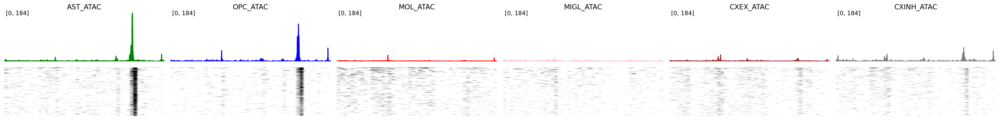

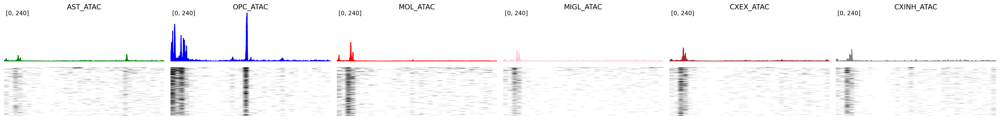

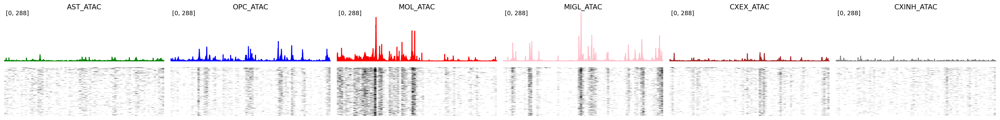

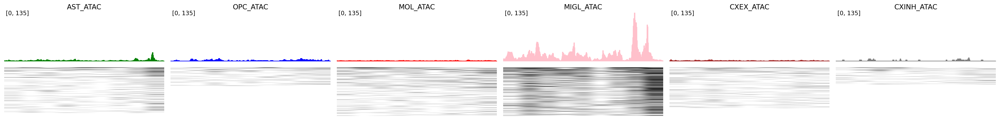

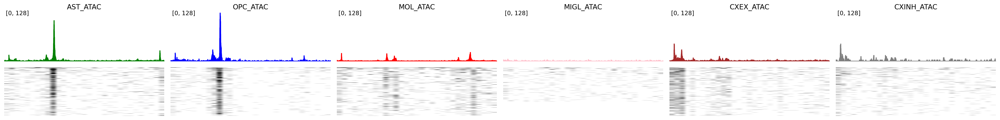

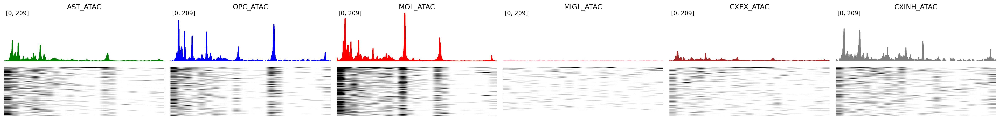

In [357]:
window = "chr18-26852043-26867771"
for r in ranges:
    w = ("-").join(r[1:])
    plot_ctype_signal(w)



In [8]:
df = pd.read_csv("ref/FINAL/230723_P29054_transferred_annotations_H3K27ac_H3K27me3_barcodes.csv", header=None)
ctype_dict = dict(zip(df[0], df[1]))
ctype_dict

{'AAACGAAAGAAATGGG-3': 'MOL',
 'AAACGAAAGAACCATA-5': 'MOL',
 'AAACGAAAGAATACTG-2': 'MOL',
 'AAACGAAAGAGAGTAG-4': 'MOL',
 'AAACGAAAGAGGCAGG-2': 'MOL',
 'AAACGAAAGAGTAAGG-1': 'MOL',
 'AAACGAAAGAGTAAGG-3': 'MOL',
 'AAACGAAAGAGTTCGG-3': 'AST',
 'AAACGAAAGATCCGAG-2': 'MIGL',
 'AAACGAAAGATCGAGC-1': 'MOL',
 'AAACGAAAGATGAGGA-3': 'MOL',
 'AAACGAAAGCAATAAC-6': 'CXEX',
 'AAACGAAAGCAATGTA-2': 'MIGL',
 'AAACGAAAGCAGTAGC-6': 'MOL',
 'AAACGAAAGCGTATCT-6': 'MOL',
 'AAACGAAAGCGTTGCC-6': 'MOL',
 'AAACGAAAGGATCCTT-6': 'CXEX',
 'AAACGAAAGGTCGGTA-4': 'MOL',
 'AAACGAAAGGTTCTCA-3': 'MOL',
 'AAACGAAAGGTTGTTC-5': 'MOL',
 'AAACGAAAGTAATGTG-1': 'MOL',
 'AAACGAAAGTAGCAAT-2': 'AST',
 'AAACGAAAGTCCTTCC-5': 'MIGL',
 'AAACGAAAGTCGAGCA-4': 'CXEX',
 'AAACGAAAGTCGCCTG-4': 'MOL',
 'AAACGAAAGTCGGGAT-6': 'MOL',
 'AAACGAAAGTCGTATC-1': 'MOL',
 'AAACGAAAGTCTGTGT-2': 'MIGL',
 'AAACGAAAGTGAAGGA-5': 'MIGL',
 'AAACGAAAGTGAGTGC-2': 'MOL',
 'AAACGAAAGTGCTGAG-5': 'CXEX',
 'AAACGAAAGTGTCGGA-4': 'MOL',
 'AAACGAAAGTTGCGCC-3': 'AST',
 

In [45]:


acdata = ad.read("mtx/raw_matrices_unprocessed/230612_P29054_H3K27ac_10kb_mtx.h5ad")
medata = ad.read("mtx/raw_matrices_unprocessed/230612_P29054_H3K27me3_10kb_mtx.h5ad")

df = pd.read_csv("ref/FINAL/230723_P29054_transferred_annotations_H3K27ac_H3K27me3_barcodes.csv", header=None)
ctype_dict = dict(zip(df[0], df[1]))

medata = medata[medata.obs.index.isin(df[0])]
medata.obs["new_annot"] = [ctype_dict[k] for k in medata.obs.index]
medata.obs["Tissue"] = ["BA4" if x.split("-")[-1]=="4" else "CSC" for x in medata.obs.index]

medata.var["chrom"] = [x.split("_")[0] for x in medata.var.index]
medata.var["start"] = [int(x.split("_")[1]) for x in medata.var.index]
medata.var["end"] = [int(x.split("_")[2]) for x in medata.var.index]

acdata = acdata[acdata.obs.index.isin(df[0])]
acdata.obs["new_annot"] = [ctype_dict[k] for k in acdata.obs.index]
acdata.obs["Tissue"] = ["BA4" if x.split("-")[-1]=="4" else "CSC" for x in acdata.obs.index]

acdata.var["chrom"] = [x.split("_")[0] for x in acdata.var.index]
acdata.var["start"] = [int(x.split("_")[1]) for x in acdata.var.index]
acdata.var["end"] = [int(x.split("_")[2]) for x in acdata.var.index]

#acdata.obs.loc[acdata.obs.new_annot.isin(["OLIGO1","OLIGO2","OLIGO3"]), "new_annot"] = "MOL"
#medata.obs.loc[medata.obs.new_annot.isin(["OLIGO1","OLIGO2","OLIGO3"]), "new_annot"] = "MOL"

Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.


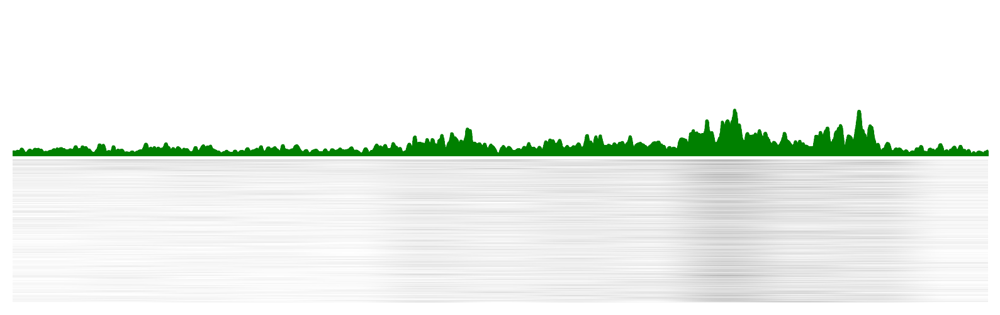

In [74]:
smallacdata = acdata[(acdata.obs.new_annot.isin(["OPC","MOL"]))&(acdata.obs.Tissue=="CSC")]

#bw_file = "../../CZI/episcanpy_analysis/AGG_ATAC_210218/data/cluster_fragments/OLD/ALL_CELL_TYPES/BW_FILES/all_MiGL_1.bed.rpkm.bw"
#bw_file = "fragments/P27505_H3K27ac_OLG/OLG_CSC_H3K27ac_fragments.bed.sorted.bam.rpkm.bw"

bw_file = "fragments/P29054/OLG_tissue/H3K27ac/BW_FILES/OLG_CSC_H3K27ac_fragments.bed.rpkm.bw"

#window="chr4-54220116-54319893" #pdgfra
#window="chr18-76900000-77200000" #mbp
#window="chr6-31613234-31619015" #AIF1
window="chr2-176_079_980-176_210_063" #HOXD
#window = "chr2-175_851_082-176_654_563" #HOXD_long
#window="chr7-27082225-27222386" #HOXA
#window = "chr2-176609657-176660010" #LINC01116

c,s,e = window.split("-")

xdata = smallacdata[:,(smallacdata.var.chrom==c) & (smallacdata.var.start>=int(s)) & (smallacdata.var.end<=int(e))]

df = pd.DataFrame.sparse.from_spmatrix(xdata.X)
df["sum"] = df.sum(axis=1)
df = df.sort_values(by="sum", ascending=False).iloc[:, :-1]
csc_ac_order = df.index                                                  
df = df.reindex(index=csc_me3_order)

fig, ax = plt.subplots(2, 1, figsize=(10,3), gridspec_kw={'height_ratios': [1, 1]})#sharex=True)

#plt.rcParams["figure.figsize"] = (10 ,2.5)


#bw_file = "../../CZI/episcanpy_analysis/AGG_ATAC_210218/data/cluster_fragments/OLD/ALL_CELL_TYPES/BW_FILES/all_OPC_1.bed.rpkm.bw"

#fig, ax = plt.subplots(1, 1, figsize=(10, 4))
#for c, ran in enumerate(ranges):
data = []
for i in range(1):
    with pyBigWig.open(bw_file) as bw:
        data.append(np.nan_to_num(bw.values(c, int(s), int(e), numpy=True),0))
#    data.append(np.nan_to_num(bw_file.values(ran[1], ran[2], ran[3], numpy=True),0))

x = np.fromiter(range(len(data[0])), dtype=int)
height = max([max(x) for x in data])
#height=160 #atac_hoxA
#height=225 #atac_hoxD
#height=120 
#height = 26 #k27ac_hoxD
#height = 31 #k27ac_hoxD_long
height = 69 #k27me3_hoxD
for i, v in enumerate(data):
    ax[0].plot(v, color="green", alpha=1)
    ax[0].fill_between(x,v, alpha=1, color = "green")
    ax[0].set_ylim(0,height)
    ax[0].set_xlim([0,int(e)-int(s)])
    ax[0].axis('off')
#ax.set_title(ran[0])

def heatmap2d(arr: np.ndarray,
             cmap="viridis",
             vmax=2):
    
    ax[1] = plt.imshow(arr, cmap=cmap, vmax=vmax, aspect="auto")
    plt.axis('off')
#    plt.colorbar()
#    plt.show()

#test_array = np.arange(50 * 50).reshape(50, 50)
test_array = df.head(40000).values#.reshape(50,50)
heatmap2d(test_array, cmap="binary", vmax=0.5)

plt.subplots_adjust(wspace=0, hspace=0.03)
#plt.savefig('plots/CSC_OLG_H3K27ac_sc_tracks_HOXD_Long.png', dpi=600)
#plt.tight_layout()



In [22]:
height

30.9753

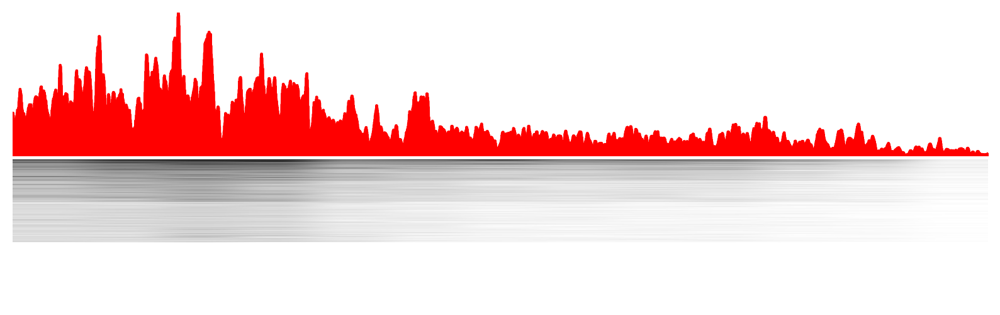

In [75]:
smallmedata = medata[(medata.obs.new_annot.isin(["OPC","MOL"]))&(medata.obs.Tissue=="CSC")]

#bw_file = "../../CZI/episcanpy_analysis/AGG_ATAC_210218/data/cluster_fragments/OLD/ALL_CELL_TYPES/BW_FILES/all_MiGL_1.bed.rpkm.bw"
#bw_file = "fragments/P27505_H3K27me3_OLG/OLG_CSC_H3K27me3_fragments.bed.sorted.bam.rpkm.bw"
bw_file = "fragments/P29054/OLG_tissue/H3K27me3/BW_FILES/OLG_CSC_H3K27me3_fragments.bed.rpkm.bw"


#window="chr4-54220116-54319893" #pdgfra
#window="chr18-76900000-77200000" #mbp
#window="chr6-31613234-31619015" #AIF1
window="chr2-176_079_980-176_210_063" #HOXD
#window = "chr2-175_851_082-176_654_563" #HOXD_long
#window="chr7-27082225-27222386" #HOXA

c,s,e = window.split("-")

xdata = smallmedata[:,(smallmedata.var.chrom==c) & (smallmedata.var.start>=int(s)) & (smallmedata.var.end<=int(e))]

df = pd.DataFrame.sparse.from_spmatrix(xdata.X)
df["sum"] = df.sum(axis=1)
df = df.sort_values(by="sum", ascending=False).iloc[:, :-1]
csc_me3_order = df.index
#df = df.reindex(index=csc_ac_order)

fig, ax = plt.subplots(2, 1, figsize=(10,3), gridspec_kw={'height_ratios': [1, 1]})#sharex=True)

#plt.rcParams["figure.figsize"] = (10 ,2.5)


#bw_file = "../../CZI/episcanpy_analysis/AGG_ATAC_210218/data/cluster_fragments/OLD/ALL_CELL_TYPES/BW_FILES/all_OPC_1.bed.rpkm.bw"


#fig, ax = plt.subplots(1, 1, figsize=(10, 4))
#for c, ran in enumerate(ranges):
data = []
for i in range(1):
    with pyBigWig.open(bw_file) as bw:
        data.append(np.nan_to_num(bw.values(c, int(s), int(e), numpy=True),0))
#    data.append(np.nan_to_num(bw_file.values(ran[1], ran[2], ran[3], numpy=True),0))

x = np.fromiter(range(len(data[0])), dtype=int)
height = max([max(x) for x in data])
#height=160 #atac_hoxA
#height=225 #atac_hoxD
#height=120 
#height = 26 #k27ac_hoxD
#height = 69 #k27me3_hoxD_long
height = 69 #k27me3_hoxD
for i, v in enumerate(data):
    ax[0].plot(v, color="red", alpha=1,)
    ax[0].fill_between(x,v, alpha=1, color = "red")
    ax[0].set_ylim(0,height)
    ax[0].set_xlim([0,int(e)-int(s)])
    ax[0].axis('off')
#ax.set_title(ran[0])

def heatmap2d(arr: np.ndarray,
             cmap="viridis",
             vmax=2):
    
    ax[1] = plt.imshow(arr, cmap=cmap, vmax=vmax, aspect="auto")
    plt.axis('off')
#    plt.colorbar()
#    plt.show()

#test_array = np.arange(50 * 50).reshape(50, 50)
test_array = df.head(40000).values#.reshape(50,50)
heatmap2d(test_array, cmap="binary", vmax=1)

plt.subplots_adjust(wspace=0, hspace=0.03)
#plt.savefig('plots/CSC_OLG_H3K27me3_sc_tracks_HOXD_Long.png', dpi=600)
#plt.title("CSC_OLG_H3K27me3_HOXD",loc=)
#plt.tight_layout()



In [63]:
height

30.9753

In [73]:
height

68.8005

## Extra stuff. Not needed for this notebook

Total number of iterations: 1
**** Running iteration 1
** Using 100018 features
 Normalizing with TFIDF
 Running SVD
 Building graph
 Clustering
 Using Leiden algorithm
 Saving cluster labels from this round
 Saving UMAP from final iteration


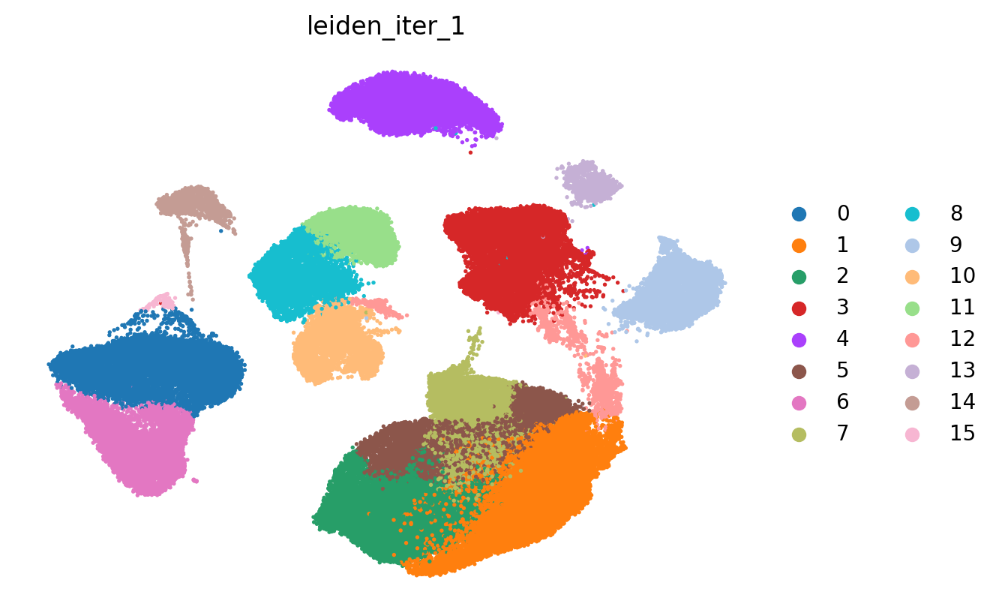

Storing normalized counts from final iteration
****** Finished iterative clustering ******


In [12]:
iterativeLSI(adata, n_iters=1, save_iter_umaps=True)

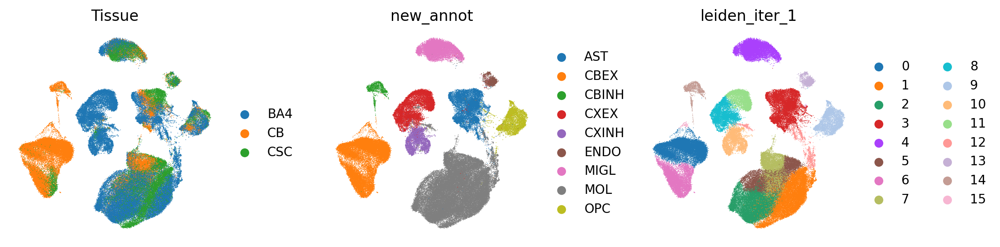

In [268]:
genes = ["Tissue","new_annot","leiden_iter_1"]
cmap = "coolwarm"
ncols=3
nrows=1
figsize=3
wspace=0.5

fig,axs = plt.subplots(nrows=nrows, ncols=ncols,
                       figsize=(
                           ncols*figsize + figsize*wspace*(ncols-1), nrows*figsize))
plt.subplots_adjust(wspace=wspace)
idx=0
#for x in range(nrows):
for y in range(ncols):
    if idx != len(genes)-1:
        sc.pl.umap(adata,color=genes[idx],ax=axs[y],show=False, frameon=False, vmax="p99.9", cmap=cmap)
    else:
        sc.pl.umap(adata,color=genes[idx],ax=axs[y], frameon=False, vmax="p99.9", cmap=cmap)
    idx+=1

#fig.savefig("plots/ATAC_umap_tissue_annot_clusters.png", dpi=400, bbox_inches='tight')        
plt.show()

In [266]:
ls = list(adata.obs.new_annot)
adata.obs["new_annot"] = ls

adata.obs.new_annot.value_counts()

MOL      45325
CBEX     21801
AST      10098
CXEX      9671
MIGL      9528
OPC       5130
CXINH     4353
ENDO      1419
CBINH     1301
Name: new_annot, dtype: int64

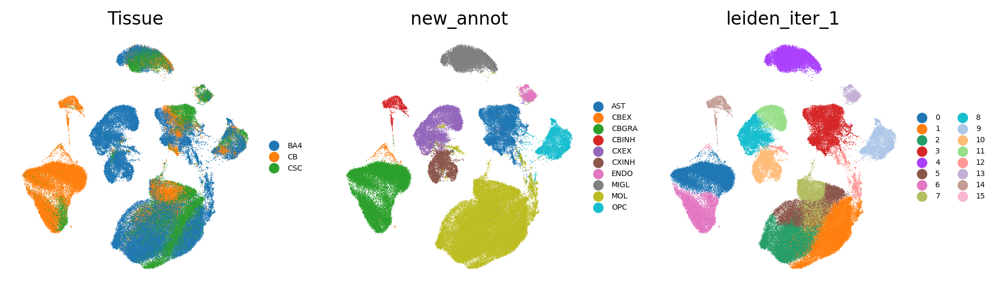

In [207]:
genes = ["Tissue","new_annot","leiden_iter_1"]
cmap = "coolwarm"
ncols=3
nrows=1
figsize=3
wspace=0.3

fig,axs = plt.subplots(nrows=nrows, ncols=ncols,
                       figsize=(
                           ncols*figsize + figsize*wspace*(ncols-1), nrows*figsize))
plt.subplots_adjust(wspace=wspace)
idx=0
#for x in range(nrows):
for y in range(ncols):
    if idx != len(genes)-1:
        sc.pl.umap(adata,color=genes[idx],ax=axs[y],show=False, frameon=False, vmax="p99.9", cmap=cmap)
    else:
        sc.pl.umap(adata,color=genes[idx],ax=axs[y], frameon=False, vmax="p99.9", cmap=cmap)
    idx+=1

#fig.savefig("plots/ATAC_umap_tissue_annot_clusters.png", dpi=400, bbox_inches='tight')        
plt.show()

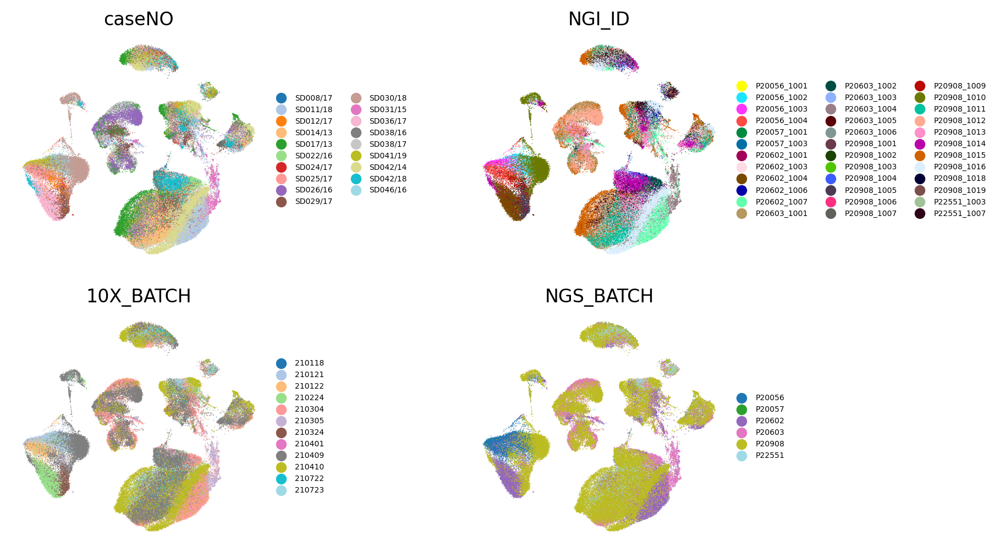

In [204]:
genes = ["caseNO","NGI_ID","10X_BATCH","NGS_BATCH"]
cmap = "coolwarm"
ncols=2
nrows=2
figsize=3
wspace=0.8

fig,axs = plt.subplots(nrows=nrows, ncols=ncols,
                       figsize=(
                           ncols*figsize + figsize*wspace*(ncols-1), nrows*figsize))
plt.subplots_adjust(wspace=wspace)
idx=0
for x in range(nrows):
    for y in range(ncols):
        if idx != len(genes)-1:
            sc.pl.umap(adata,color=genes[idx],ax=axs[x,y],show=False, frameon=False, vmax="p99.9", cmap=cmap)
        else:
            sc.pl.umap(adata,color=genes[idx],ax=axs[x,y], frameon=False, vmax="p99.9", cmap=cmap)
        idx+=1

fig.savefig("plots/ATAC_umap_batches.png", dpi=400, bbox_inches='tight')        
plt.show()

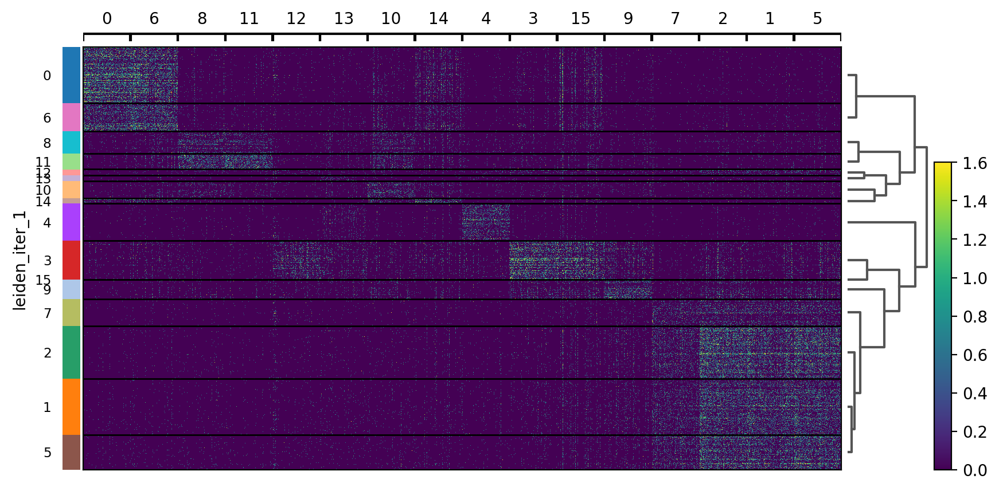

In [37]:
#sc.pp.log1p(adata)
#adata.layers["log1p_counts"] = adata.X.copy()
#sc.tl.rank_genes_groups(adata, "leiden_iter_1")
sc.pl.rank_genes_groups_heatmap(adata, key="rank_genes_groups", figsize=(10,5), n_genes=100, cmap="viridis", vmax=1.6)

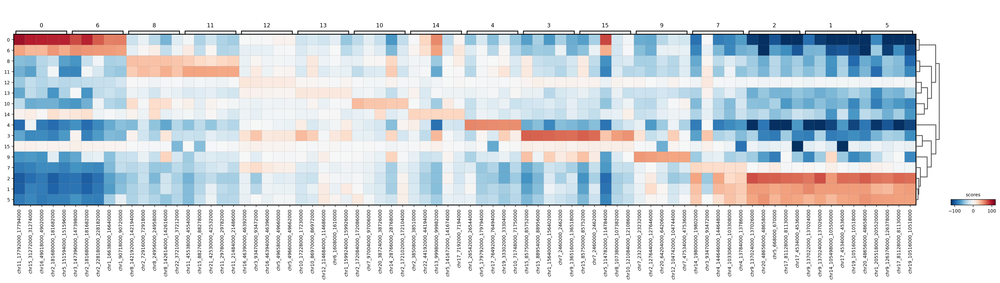

In [273]:
subresult2 = adata.uns["rank_genes_groups"]
var_genes = pd.DataFrame(subresult2['names']).head(5).to_dict(orient="list")

sc.pl.rank_genes_groups_matrixplot(adata, key="rank_genes_groups", values_to_plot="scores", 
                                   var_names=var_genes, cmap="RdBu_r", vmin=-120, vmax=120)

In [281]:
import pickle

with open("../../CZI/episcanpy_analysis/AGG_ATAC_210218/ref/tss_scores_dict.pickle","rb") as f:
    dct = pickle.load(f)
adata.obs["TSSe"] = [dct[k] if k in dct.keys() else 0 for k in adata.obs.index]

In [294]:
np.median(adata[adata.obs.TSSe>0].obs.TSSe)
#10**np.median(adata.obs.log_nb_features)

10.717

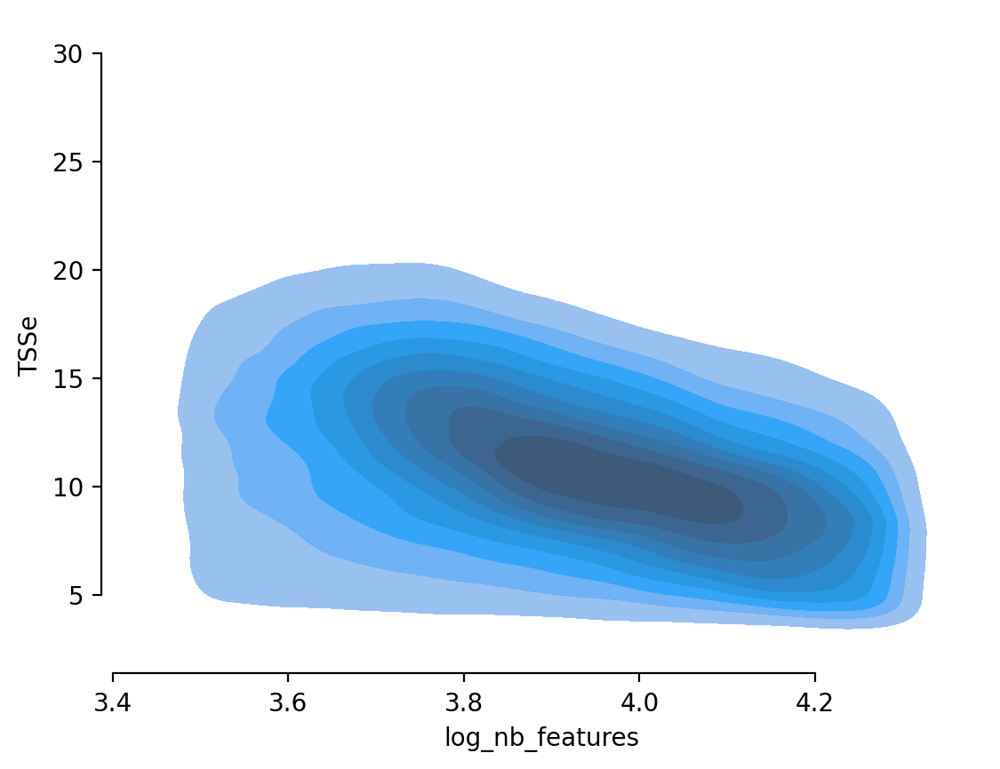

In [289]:
#sns.scatterplot(data = adata[adata.obs.TSSe>0].obs, x="log_nb_features",y="TSSe", s=1)
sns.kdeplot(data = adata[adata.obs.TSSe>0].obs, x="log_nb_features",y="TSSe", fill=True)
sns.despine(trim=True)

### Plot gene activity for marker genes

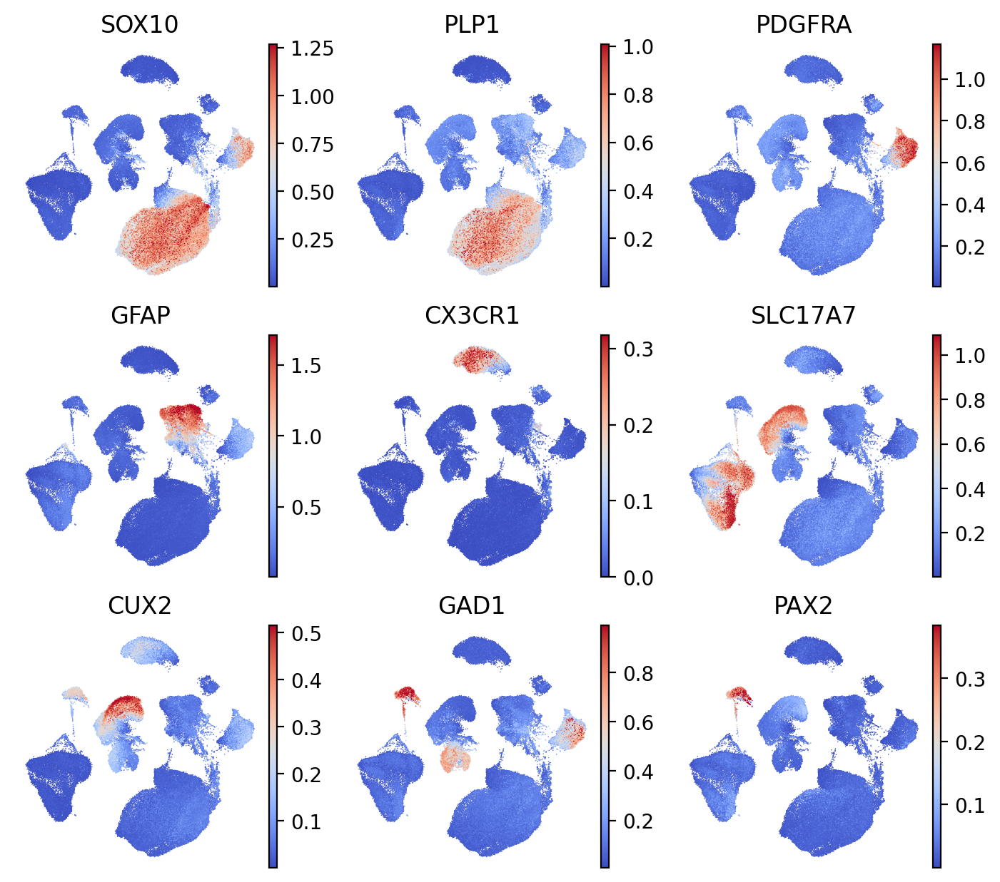

In [203]:
#padata = ad.read("/data/proj/GCB_MK/CZI/episcanpy_analysis/AGG_ATAC_210218/PIPELINE/data/matrices/230205_2kb_PA_magic-matrix.h5ad")
#padata = padata[padata.obs.index.isin(adata.obs.index)].copy()
#padata.obsm["X_umap"] = adata.obsm["X_umap"].copy()


genes = ["SOX10","PLP1","PDGFRA","GFAP","CX3CR1","SLC17A7","CUX2","GAD1","PAX2"]
cmap = "coolwarm"
ncols=3
nrows=3
figsize=2.5
wspace=0.2


fig,axs = plt.subplots(nrows=nrows, ncols=ncols,
                       figsize=(ncols*figsize+figsize*wspace*(ncols-1),nrows*figsize))
plt.subplots_adjust(wspace=wspace)
idx=0
for x in range(ncols):
    for y in range(nrows):
        if idx != len(genes)-1:
            sc.pl.umap(padata,color=genes[idx],ax=axs[x,y],show=False, frameon=False, vmax="p99.9", cmap=cmap)
        else:
            sc.pl.umap(padata,color=genes[idx],ax=axs[x,y], frameon=False, vmax="p99.9", cmap=cmap)
        idx+=1

fig.savefig("plots/ATAC_umap_marker_geneActivity.png", dpi=400, bbox_inches='tight')
plt.show()

In [56]:
#sc.external.pp.scanorama_integrate(adata, key="NGS_BATCH") ## memory error
#sc.external.pp.scanorama_integrate(adata, key="NGS_BATCH") ## memory error

sc.external.pp.harmony_integrate(adata, key="10X_BATCH")

adata.obsm["X_pca_original"] = adata.obsm["X_pca"].copy()
adata.obsm["X_umap_original"] = adata.obsm["X_umap"].copy()
adata.obsm["X_pca"] = adata.obsm["X_pca_harmony"].copy()

sc.pp.neighbors(adata,  n_pcs=30, metric="cosine")
sc.tl.umap(adata, n_components=3)

adata.obsm["X_umap_harmony"] = adata.obsm["X_umap"].copy()
adata.obsm["X_umap"] = adata.obsm["X_umap_original"].copy()

adata.raw = adata

#adata.write("mtx/ATAC_object_230726.h5ad")

In [217]:
#bdata = adata[adata.obs.new_annot.isin(["MOL","OPC"])].copy()
#bdata.X = bdata.layers["raw_counts"].copy()
#iterativeLSI(bdata, n_iters=1, save_iter_umaps=True)

#sc.pp.log1p(bdata)
#bdata.layers["log1p_counts"] = bdata.X.copy()
sc.tl.rank_genes_groups(bdata, "leiden_iter_1")

In [235]:
plt.rcParams["figure.figsize"] 

[6.4, 4.8]

In [ ]:
bdata.obsm["X_pca"] = bdata.obsm["X_pca_original"].copy()

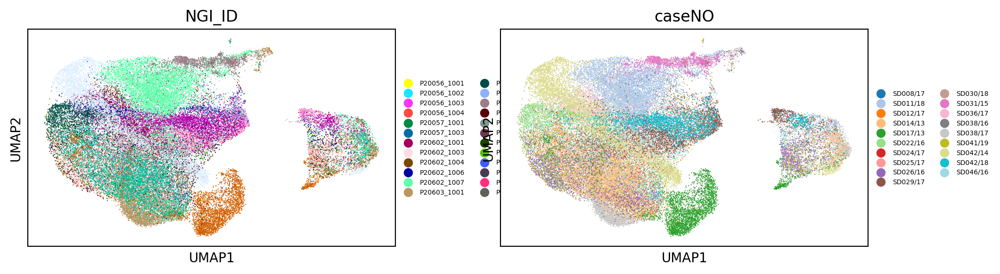

In [240]:
sc.pl.umap(bdata, color=["NGI_ID","caseNO"])

In [9]:
adata = ad.read("mtx/ATAC_object_230726.h5ad")
adata.obs.loc[adata.obs.new_annot=="CBGRA","new_annot"] = "CBEX"

In [14]:
motifdata = ad.read("/data/proj/GCB_MK/CZI/episcanpy_analysis/AGG_ATAC_210218/PIPELINE/data/chromvar_analysis_FBP/motif_deviations_chromVar_kNN_UMAP.h5ad")

In [122]:
#motifdata = motifdata[motifdata.obs.index.isin(adata.obs.index)].copy()
ctype_dict = dict(zip(adata.obs.index, adata.obs.new_annot))
motifdata.obs["new_annot"] = [ctype_dict[k] for k in motifdata.obs.index]

#sc.tl.umap(motifdata)

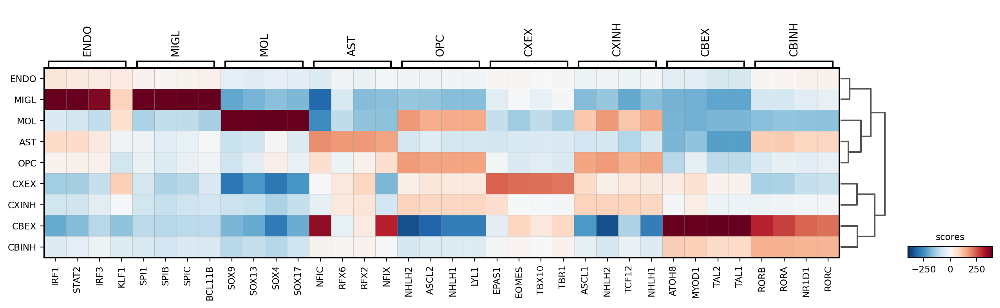

In [240]:
#sc.tl.rank_genes_groups(motifdata, "new_annot")
subresult = motifdata.uns["rank_genes_groups"]
var_genes = pd.DataFrame(subresult['names']).head(4).to_dict(orient="list")

sc.pl.rank_genes_groups_matrixplot(motifdata, key="rank_genes_groups", values_to_plot="scores", 
                                   var_names=var_genes, cmap="RdBu_r", vmin=-400, vmax=400)

In [249]:
plt.rcParams["figure.figsize"]

[6.4, 4.8]

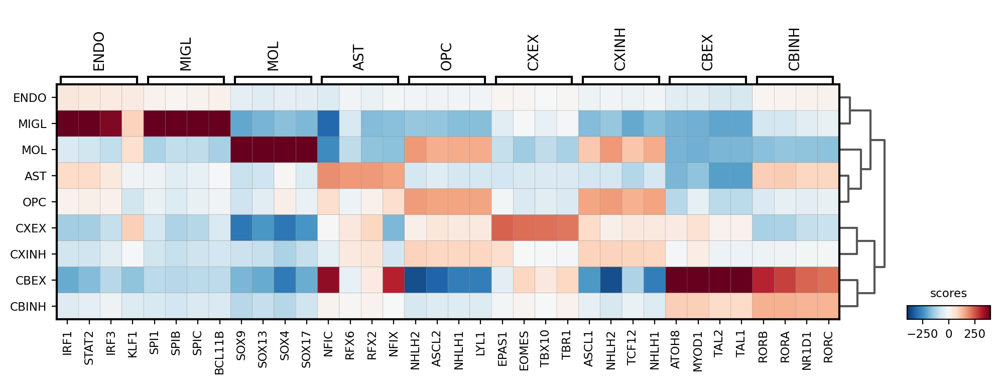

In [253]:
#genes = ["new_annot"]
cmap = "bwr"
ncols=1
nrows=1
figsize=3.5


fig,axs = plt.subplots(nrows=1, ncols=1,figsize=(12,4))

sc.pl.rank_genes_groups_matrixplot(motifdata, ax=axs, key="rank_genes_groups", values_to_plot="scores", var_names=var_genes,
                                      cmap="RdBu_r", vmin=-400, vmax=400)


fig.savefig("plots/ATAC_enrichedTF_matrix.png", dpi=400, bbox_inches='tight')
plt.show()



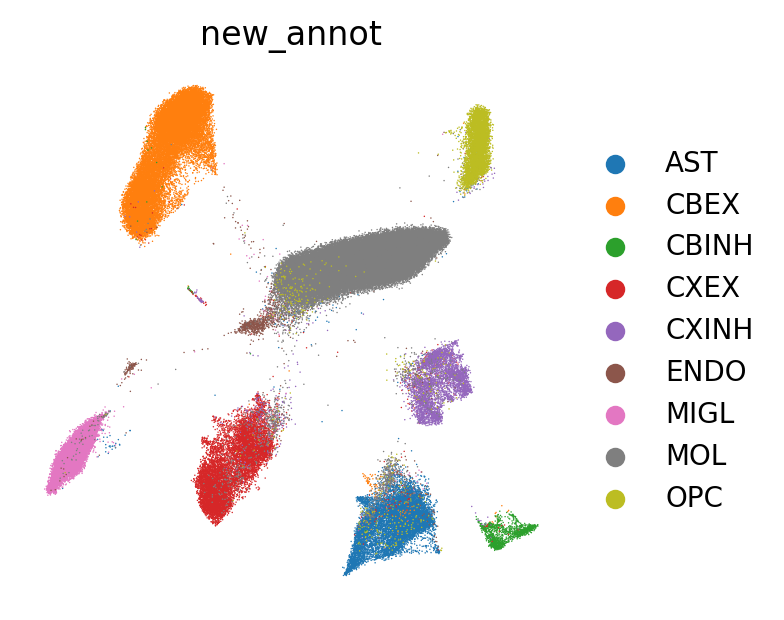

In [247]:
genes = ["new_annot"]
cmap = "bwr"
ncols=1
nrows=1
figsize=3.5
wspace=0.5

fig,axs = plt.subplots(nrows=nrows, ncols=ncols,
                       figsize=(ncols*figsize+figsize*wspace*(ncols-1),nrows*figsize))

sc.pl.umap(motifdata,color=genes[idx],ax=axs, frameon=False, vmax="p99.99", cmap=cmap)


fig.savefig("plots/ATAC_umap_chromvar_annot.png", dpi=400, bbox_inches='tight')
plt.show()

AnnData object with n_obs × n_vars = 108626 × 100018
    obs: 'NGI_ID', 'NGS_BATCH', 'caseNO', 'Tissue', 'Sex', 'Age', 'PMI', '10X_BATCH', 'nb_features', 'log_nb_features', 'leiden_iter_1', 'leiden_iter_2', 'leiden_iter_3', 'leiden_iter_4', 'annot_rough', 'doublet_scores', 'predicted_doublets', 'ArchR_id', 'is_ArchR_hiQ', 'new_annot', 'LS_RNA', 'Nat19_RNA'
    var: 'n_cells'
    uns: '10X_BATCH_colors', 'NGI_ID_colors', 'NGS_BATCH_colors', 'Tissue_colors', 'annot_rough_colors', 'caseNO_colors', 'dendrogram_leiden_iter_1', 'is_ArchR_hiQ_colors', 'leiden', 'leiden_iter_1_colors', 'leiden_iter_4_colors', 'neighbors', 'new_annot_colors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_pca_original', 'X_umap', 'X_umap_harmony', 'X_umap_original'
    layers: 'log1p_counts', 'norm_counts', 'normalized_counts', 'raw_counts'
    obsp: 'connectivities', 'distances'

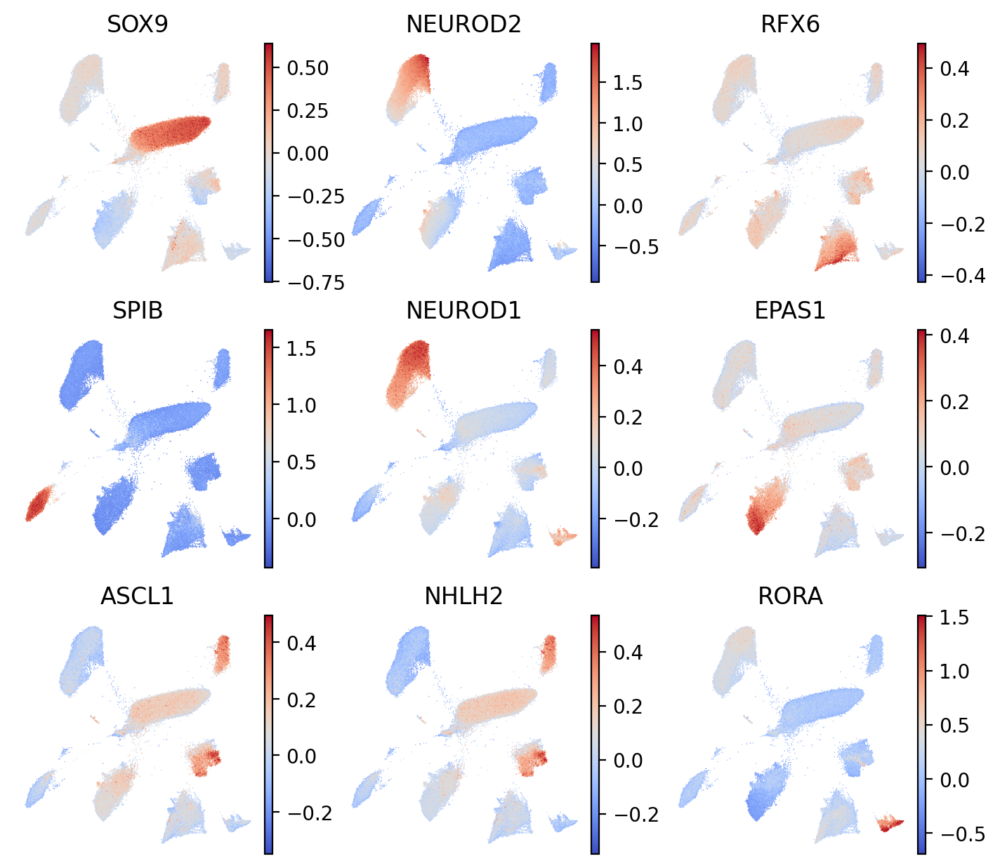

In [243]:
genes = ["SOX9","NEUROD2","RFX6","SPIB","NEUROD1","EPAS1","ASCL1","NHLH2","RORA"]
cmap = "coolwarm"
ncols=3
nrows=3
figsize=2.5
wspace=0.2


fig,axs = plt.subplots(nrows=nrows, ncols=ncols,
                       figsize=(ncols*figsize+figsize*wspace*(ncols-1),nrows*figsize))
plt.subplots_adjust(wspace=wspace)
idx=0
for x in range(ncols):
    for y in range(nrows):
        if idx != len(genes)-1:
            sc.pl.umap(motifdata,color=genes[idx],ax=axs[x,y],show=False, frameon=False, vmax="p99.99", cmap=cmap)
        else:
            sc.pl.umap(motifdata,color=genes[idx],ax=axs[x,y], frameon=False, vmax="p99.99", cmap=cmap)
        idx+=1

fig.savefig("plots/ATAC_umap_chromvarTF.png", dpi=400, bbox_inches='tight')
plt.show()

### iLSI Functions 

In [3]:
import os
import csv
import scipy
import scanpy as sc
import anndata as ad
import numpy as np
import pandas as pd
import episcanpy.api as epi
import magic
#import scprep
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.utils import check_random_state
from sklearn.decomposition import TruncatedSVD
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import style
import warnings

# Run TFIDF Normalization
def runTfIdf(
    adata_atac, 
    scale_factor=1e4, 
    copy=False):
    """
    TF-IDF normalization according to MultiVelo
    """
    npeaks = adata_atac.X.sum(1)
    npeaks_inv = scipy.sparse.csr_matrix(1.0/npeaks)
    tf = adata_atac.X.multiply(npeaks_inv)
    idf = scipy.sparse.diags(np.ravel(adata_atac.X.shape[0] / adata_atac.X.sum(0))).log1p()
    if copy:
        adata_atac_copy = adata_atac.copy()
        adata_atac_copy.X = tf.dot(idf) * scale_factor
        return adata_atac_copy
    else:
        adata_atac.X = tf.dot(idf) * scale_factor

## Run SVD
def runSVD(
    adata_atac, 
    algorithm="arpack", 
    n_components=30, 
    pca_key="X_pca"):
    random_state = np.random.RandomState(0)
    random_state = check_random_state(random_state)
    pca_ = TruncatedSVD(n_components=n_components, random_state=random_state, algorithm=algorithm)
    X_pca = pca_.fit_transform(adata_atac.X)
    
    adata_atac.obsm[pca_key] = X_pca
    adata_atac.uns["pca"] = {}
    adata_atac.uns["pca"]["params"] = {"zero_center": False}
    adata_atac.uns["pca"]["variance"] = pca_.explained_variance_
    adata_atac.uns["pca"]["variance_ratio"] = pca_.explained_variance_ratio_
    adata_atac.varm["PCs"] = pca_.components_.T

## Flatten a list of lists
def flatten(t):
    return [i for s in t for i in s]

## Select top variable features across each cluster 
def selectVarFeatures(adata_atac, use_key=None, min_cells_per_cluster=500):
    var_features = []
    for cluster in set(adata_atac.obs[use_key]):
        minidata = adata_atac[adata_atac.obs[use_key]==cluster].copy()
        if minidata.shape[0] < min_cells_per_cluster:
            continue
        else:
            n_cells = np.array(np.sum(minidata.layers["raw_counts"], axis=0).T)
            z_score_acc = scipy.stats.zscore(n_cells)
            minidata.var["abs_z"] = [abs(x) for x in np.concatenate(z_score_acc).ravel().tolist()]
            var_features.append(minidata[:,minidata.var["abs_z"]>1.65].var_names.tolist())

    var_features = list(set(flatten(var_features)))
    return adata_atac[:,var_features].copy()

def iterativeLSI(
    adata_atac,
    n_pc_comps=30,
    n_iters=3,
    cluster_res=0.5,
    distance_metric="cosine",
    clustering_method="leiden",
    save_iter_umaps=False,
    file_format = "png",
    use_binary_counts=False,
    min_cells_per_cluster=500):
    """
    Run iterative LSI on the AnnData object. 
    TFIDF -> SVD -> KNN --> Cluster --> variable_features --> TFIDF ... 
    """
    
    #check layers in adata
    if "raw_counts" not in adata_atac.layers:
        print("Raw Counts not saved. Saving now.")
        if np.max(adata_atac.X) > 1:
            adata_atac.layers["raw_counts"] = adata_atac.X.copy()
        else:
            raise Exception("Raw counts missing")
        if use_binary_counts:
            print("Using binary counts. Binarizing matrix.")
            epi.pp.binarize(adata_atac)
            adata_atac.layer["binary_counts"] = adata_atac.X.copy()
        else:
            print("Not using binary counts for LSI. Proceeding with raw counts.")
    

    adata_i = adata_atac.copy()

    print(f"Total number of iterations: {n_iters}")
    for i in range(1, n_iters+1):
        print(f"**** Running iteration {i}")
        print(f"** Using {str(adata_i.shape[-1])} features")

        ## run LSI
        print(" Normalizing with TFIDF")
        runTfIdf(adata_i)
        print(" Running SVD")
        runSVD(adata_i, n_components=n_pc_comps)

        
        ## build kNN graph
        print(" Building graph")
        sc.pp.neighbors(adata_i,  n_pcs=n_pc_comps, metric=distance_metric)
        
        print(" Clustering")
        ## Clustering
        if clustering_method == "louvain":
            cluster_key = "louvain_iter_"
            cluster_key_added = cluster_key + str(i)
            try:
                sc.tl.louvain(adata_i, resolution=cluster_res, key_added=cluster_key_added)
            except:           ## Not sure what exception to catch here --> check this!
                raise Exception("Can't run -  Fix the louvain dependency issue first")
        elif clustering_method == "leiden":
            print(f" Using Leiden algorithm")
            cluster_key = "leiden_iter_"
            cluster_key_added = cluster_key + str(i)
            sc.tl.leiden(adata_i, resolution=cluster_res, key_added=cluster_key_added)
        
        print(f" Saving cluster labels from this round")
        ## add clustering result to adata_atac
        adata_atac.obs[cluster_key_added] = adata_i.obs[cluster_key_added].copy()


        if i != n_iters:
            ## save intermediate UMAP if needed
            if save_iter_umaps:
                print(f" Saving iteration {i} umap")
                sc.tl.umap(adata_i)
                sc.pl.umap(adata_i, color=cluster_key_added, show=True, frameon=False, size=15)
            
            ## select variable features from original adata_atac dataset
            print("** Selecting variable features")
            adata_i = selectVarFeatures(adata_atac, use_key=cluster_key_added,
                                        min_cells_per_cluster=min_cells_per_cluster)
            adata_i.X = adata_i.layers["raw_counts"].copy()

        else: ## Final iteration
            print(f" Saving UMAP from final iteration")
            sc.tl.umap(adata_i)
            sc.pl.umap(adata_i, color=cluster_key_added, frameon=False, size=15)
            adata_i.layers["norm_counts"] = adata_i.X.copy()
            adata_atac.layers = adata_i.layers.copy()
            print("Storing normalized counts from final iteration")
            adata_atac.obsp = adata_i.obsp.copy()
            adata_atac.uns = adata_i.uns.copy()
            adata_atac.obsm = adata_i.obsm.copy()
            print("****** Finished iterative clustering ******")